In [23]:
from sqlalchemy import create_engine, text, inspect
import pandas as pd
import pymysql
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np

In [24]:
# Variables globales
engine = None

def connect_to_db():
    global engine
    user = 'root'
    password = 'rootpassword'
    host = '127.0.0.1'
    port = 3309
    db = 'AIRQUALITY'

    connection_string = f"mysql+pymysql://{user}:{password}@{host}:{port}/{db}"
    engine = create_engine(connection_string)
    print("✅ Conexión a MySQL creada.")


In [25]:
def plot_correlation_map(df, title="Mapa de Correlaciones", figsize=(10, 8), cmap="coolwarm"):
    """
    Genera un mapa de calor con la matriz de correlaciones del DataFrame.

    Parámetros:
        df (pd.DataFrame): DataFrame de entrada
        title (str): Título del gráfico
        figsize (tuple): Tamaño del gráfico
        cmap (str): Paleta de colores del heatmap

    Retorna:
        None
    """
    # Filtrar solo columnas numéricas
    numeric_df = df.select_dtypes(include='number')

    if numeric_df.shape[1] < 2:
        print("⚠️ El DataFrame debe tener al menos dos columnas numéricas para calcular correlaciones.")
        return

    # Calcular matriz de correlación
    corr = numeric_df.corr()

    # Graficar heatmap
    plt.figure(figsize=figsize)
    sns.heatmap(corr, annot=True, fmt=".2f", cmap=cmap, square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
    plt.title(title)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


In [26]:
def load_resampled_dataframes_from_db():
    """
    Carga los datos desde las tablas resampleadas de la base de datos 
    y los devuelve como DataFrames de pandas.

    Retorna:
        tuple: (df_aq2, df_aq1, df_aqsep)
    """
    if engine is None:
        raise Exception("⚠️ Debes ejecutar primero `connect_to_db()` para establecer la conexión.")

    try:
        df_aq2 = pd.read_sql("SELECT * FROM DF_AQ2_RESAMPLED", con=engine, parse_dates=["time_format"])
        df_aq1 = pd.read_sql("SELECT * FROM DF_AQ1_RESAMPLED", con=engine, parse_dates=["time_format"])
        df_aqsep = pd.read_sql("SELECT * FROM DF_AQSEP_RESAMPLED", con=engine, parse_dates=["time_format"])

        # Asegurarse de que 'time_format' sea el índice si está presente
        for df in [df_aq2, df_aq1, df_aqsep]:
            if 'time_format' in df.columns:
                df.set_index('time_format', inplace=True)

        print("✅ Tablas resampleadas cargadas correctamente.")
        return df_aq2, df_aq1, df_aqsep

    except Exception as e:
        print(f"❌ Error al cargar las tablas resampleadas: {e}")
        return None, None, None


In [27]:
# Ejecutar primero conexión
connect_to_db()
# Cargar los DataFrames desde MySQL
DF_AQ2, DF_AQ1, DF_AQSEP = load_resampled_dataframes_from_db()

✅ Conexión a MySQL creada.
✅ Tablas resampleadas cargadas correctamente.


In [28]:
print(DF_AQ2.head())
print(DF_AQ1.head())
print(DF_AQSEP.head())

                     pm2_5  pm10    co   o3  humidity  temperature  pm5
time_format                                                            
2023-06-28 00:00:00   13.0  22.5  15.5  0.0      81.2        11.05  6.0
2023-06-28 01:00:00   10.0  13.0  12.5  0.0      83.9        10.90  5.0
2023-06-28 02:00:00   11.0  13.0  14.0  0.0      83.7        10.20  6.0
2023-06-28 03:00:00   13.0  21.0  17.0  0.0      85.7        10.30  6.0
2023-06-28 04:00:00   17.0  24.0  14.0  0.0      85.6        10.10  9.0
                     pm2_5  pm10    co   o3  humidity  temperature   pm5
time_format                                                             
2023-06-28 00:00:00    8.0  13.0  16.0  0.0      75.1         11.4   5.0
2023-06-28 01:00:00   18.0  22.0  14.0  0.0      79.6         10.5   9.0
2023-06-28 02:00:00   18.0  21.0  15.5  0.0      78.4         11.0   8.0
2023-06-28 03:00:00   21.0  26.0  14.0  0.0      81.6          9.7  10.0
2023-06-28 04:00:00   20.0  25.0  15.0  0.0      79.3     

In [29]:
def filter_dataframe_by_date_range(df, start_date, end_date, plot=True):
    """
    Filtra un DataFrame por un rango de fechas y opcionalmente grafica todas las columnas numéricas.

    Parámetros:
        df (pd.DataFrame): DataFrame con índice datetime
        start_date (str): Fecha de inicio (formato 'YYYY-MM-DD HH:MM:SS')
        end_date (str): Fecha de fin (formato 'YYYY-MM-DD HH:MM:SS')
        plot (bool): Si True, genera el gráfico de todas las columnas numéricas

    Retorna:
        pd.DataFrame: DataFrame filtrado por fechas
    """
    # Copiar y asegurar que el índice sea datetime
    df = df.copy()
    df.index = pd.to_datetime(df.index)

    # Filtrar por fechas
    filtered_df = df[(df.index >= start_date) & (df.index <= end_date)]

    # Si se solicita, graficar todas las columnas numéricas
    if plot:
        numeric_cols = filtered_df.select_dtypes(include='number').columns

        if numeric_cols.empty:
            print("⚠️ No hay columnas numéricas para graficar.")
        else:
            plt.figure(figsize=(14, 6))
            filtered_df[numeric_cols].plot(kind='line', figsize=(14, 6))
            plt.title(f'Variables numéricas desde {start_date} hasta {end_date}', fontsize=14)
            plt.xlabel('Fecha y hora', fontsize=12)
            plt.ylabel('Valores', fontsize=12)
            plt.legend(title='Variables')
            plt.grid(True)
            plt.tight_layout()
            plt.show()

    return filtered_df


In [30]:
DF_AQ1_F = filter_dataframe_by_date_range(DF_AQ1, '2023-08-01 00:00:00', '2024-03-13 00:00:00', plot=False)
DF_AQ2_F = filter_dataframe_by_date_range(DF_AQ2, '2023-08-01 00:00:00', '2024-03-13 00:00:00', plot=False)
DF_AQSEP_F = filter_dataframe_by_date_range(DF_AQSEP, '2023-08-01 00:00:00', '2024-03-13 00:00:00', plot=False)

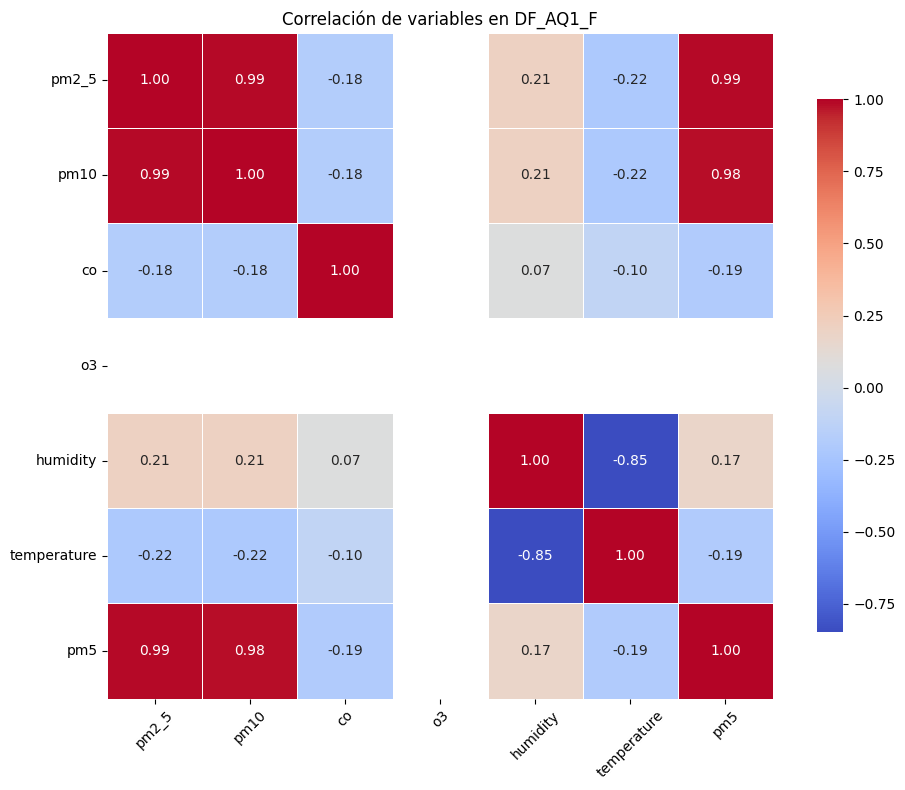

In [31]:
plot_correlation_map(DF_AQ1_F, title="Correlación de variables en DF_AQ1_F")

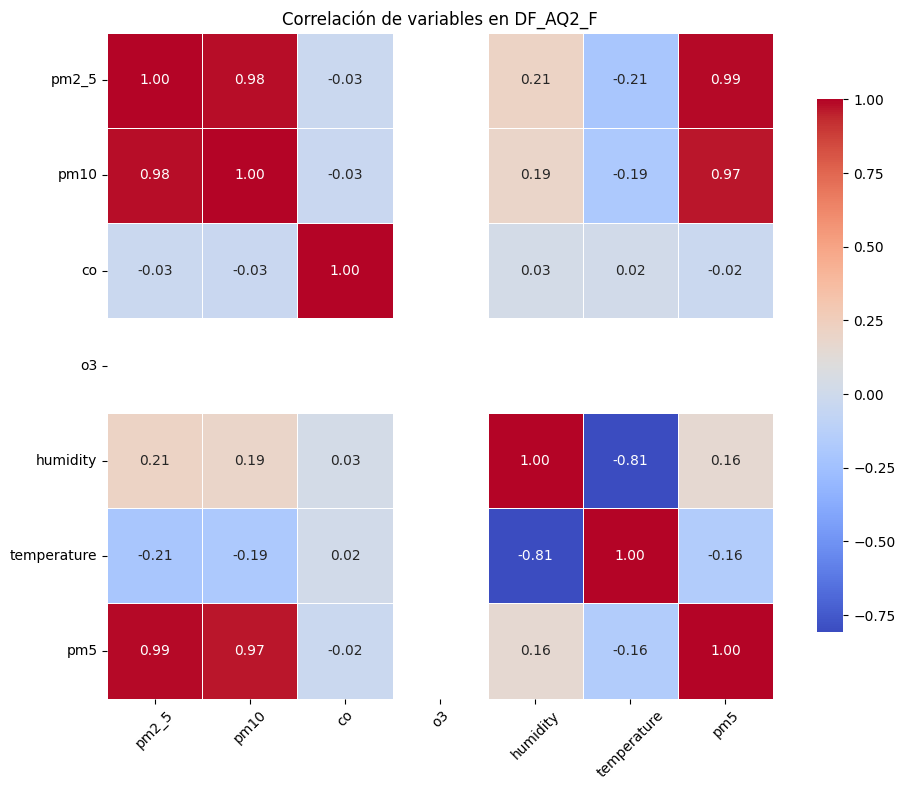

In [32]:
plot_correlation_map(DF_AQ2_F, title="Correlación de variables en DF_AQ2_F")

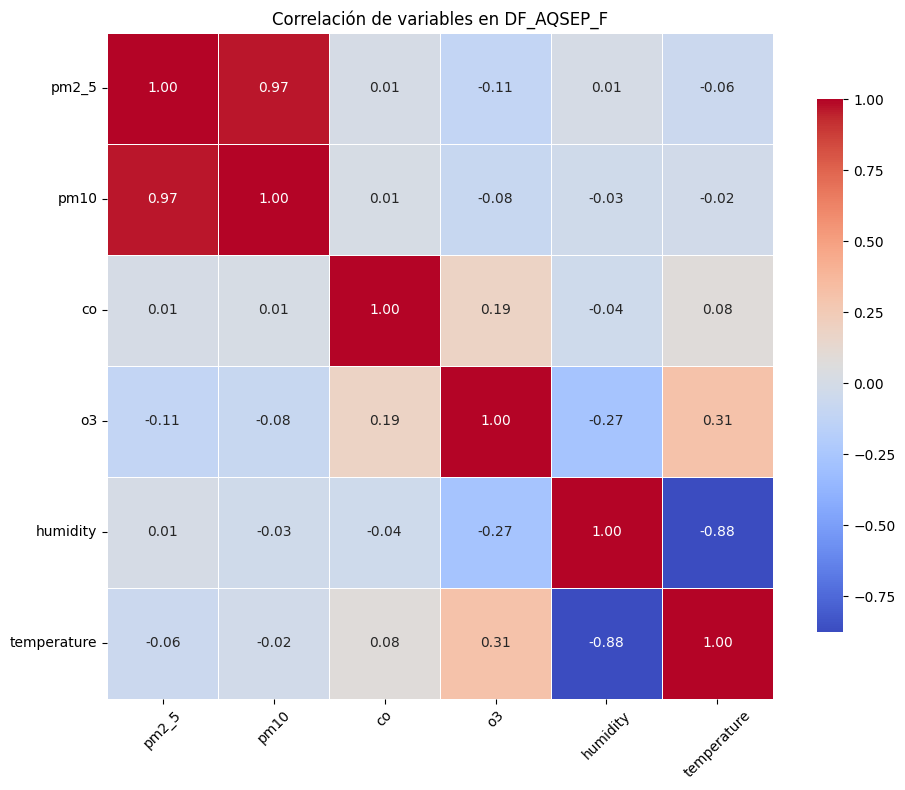

In [33]:
plot_correlation_map(DF_AQSEP_F, title="Correlación de variables en DF_AQSEP_F")

In [37]:
#DF_AQ2_FC = DF_AQ2_F.drop(columns=['co', 'o3'])
#DF_AQ1_FC = DF_AQ1_F.drop(columns=['co', 'o3'])
#DF_AQSEP_FC = DF_AQSEP_F.drop(columns=['co', 'o3'])
DF_AQ2_FC = DF_AQ2_F.drop(columns=['o3'])
DF_AQ1_FC = DF_AQ1_F.drop(columns=['o3'])
DF_AQSEP_FC = DF_AQSEP_F

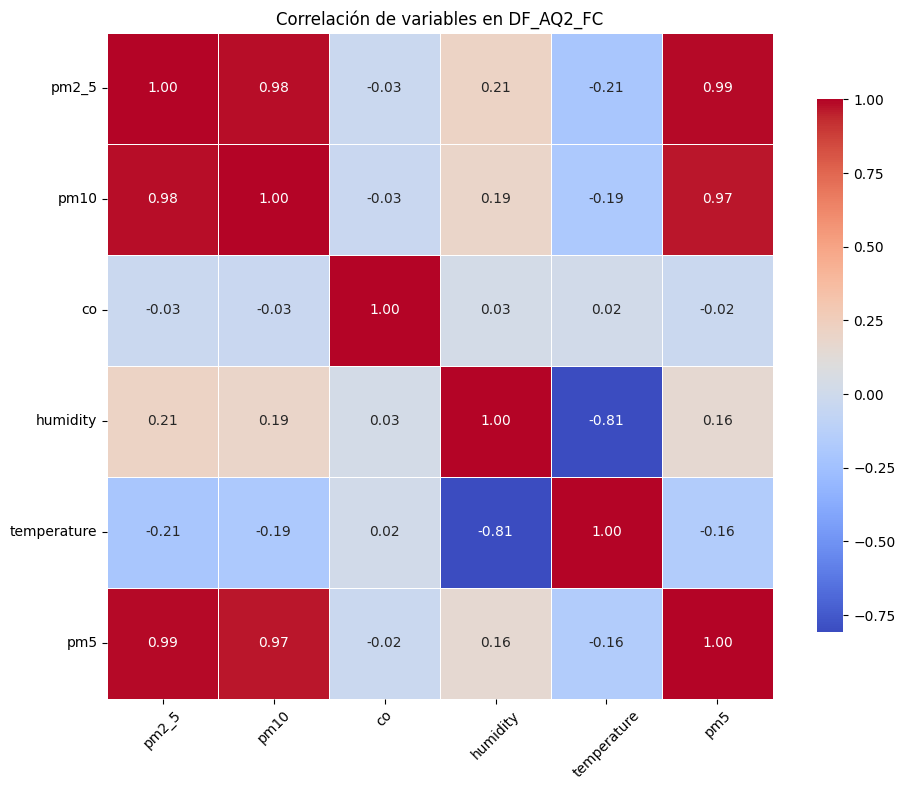

In [38]:
plot_correlation_map(DF_AQ2_FC, title="Correlación de variables en DF_AQ2_FC")

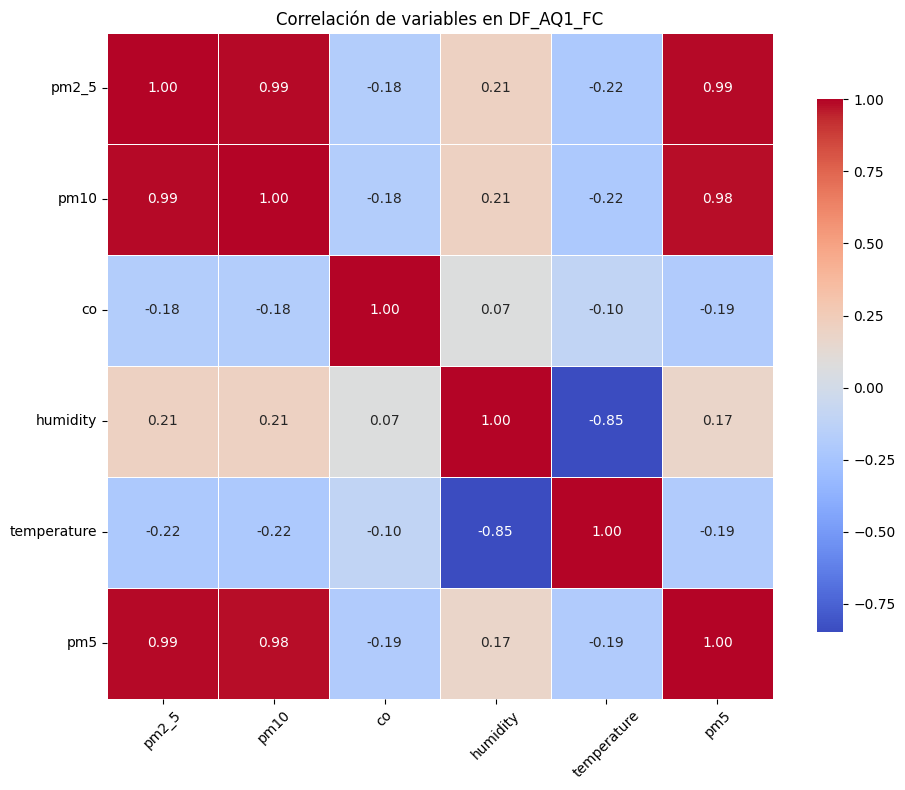

In [39]:
plot_correlation_map(DF_AQ1_FC, title="Correlación de variables en DF_AQ1_FC")

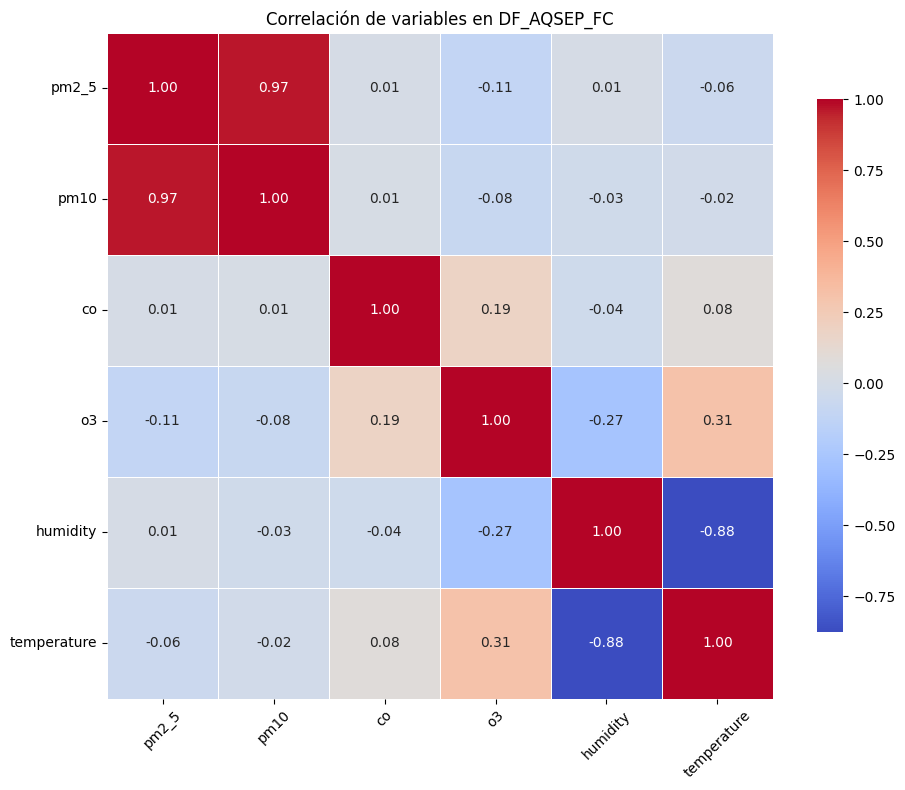

In [40]:
plot_correlation_map(DF_AQSEP_FC, title="Correlación de variables en DF_AQSEP_FC")

In [ ]:
def imputar_valores_sarima(df, columna='pm10', plot=True, 
                               order=(1,1,1), seasonal_order=(1,1,1,24)):
    """
    Función para imputar valores faltantes en datos de calidad del aire (PM10)
    utilizando el modelo SARIMA, con manejo mejorado de índices de tiempo.
    
    Parámetros:
    -----------
    df : DataFrame
        DataFrame con índice temporal y columna de PM10 con valores faltantes
    columna : str, default='pm10'
        Nombre de la columna que contiene los datos de PM10
    plot : bool, default=True
        Si se deben mostrar gráficos de los resultados
    order : tuple, default=(1,1,1)
        Orden del modelo SARIMA (p,d,q)
    seasonal_order : tuple, default=(1,1,1,24)
        Orden estacional del modelo SARIMA (P,D,Q,s) - default estacionalidad diaria
        
    Retorna:
    --------
    DataFrame con los valores imputados
    """
    # Crear una copia del DataFrame original
    df_imputado = df.copy()
    
    # Asegurarse de que el índice es datetime
    if not isinstance(df_imputado.index, pd.DatetimeIndex):
        print("ADVERTENCIA: El índice no es de tipo datetime. Se recomienda establecer un índice de tiempo.")
    
    # Verificar si hay valores faltantes
    if not df_imputado[columna].isna().any():
        print("No hay valores faltantes en la columna", columna)
        return df_imputado
    
    # Identificar posiciones de valores faltantes
    mask_nan = df_imputado[columna].isna()
    indices_nan = np.where(mask_nan)[0]
    print(f"Se encontraron {len(indices_nan)} valores faltantes")
    
    # Si todos los valores son NaN, no podemos hacer imputación con SARIMA
    if len(indices_nan) == len(df_imputado):
        raise ValueError("Todos los valores son NaN, no se puede realizar la imputación con SARIMA")
    
    # Encontrar secuencias de valores NaN consecutivos
    secuencias_nan = []
    secuencia_actual = []
    
    for i in range(len(indices_nan)):
        if i == 0 or indices_nan[i] != indices_nan[i-1] + 1:
            if secuencia_actual:
                secuencias_nan.append(secuencia_actual)
            secuencia_actual = [indices_nan[i]]
        else:
            secuencia_actual.append(indices_nan[i])
    
    if secuencia_actual:
        secuencias_nan.append(secuencia_actual)
    
    print(f"Usando parámetros SARIMA: {order} x {seasonal_order}")
    
    # Función para imputar una secuencia de valores faltantes
    def imputar_secuencia(indices):
        # Si es el primer valor en el índice, no podemos usar datos anteriores
        if indices[0] == 0:
            inicio_entrenamiento = indices[-1] + 1
            fin_entrenamiento = min(inicio_entrenamiento + 24*7, len(df_imputado) - 1)  # Usar 1 semana de datos si está disponible
            
            if inicio_entrenamiento >= len(df_imputado) or fin_entrenamiento >= len(df_imputado):
                # Si no hay datos después, usar la media
                valor_medio = df_imputado[columna].mean()
                for idx in indices:
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
                print(f"Usando la media ({valor_medio}) para imputar valores al inicio")
                return
            
            # Entrenar modelo con datos posteriores
            train = df_imputado.iloc[inicio_entrenamiento:fin_entrenamiento+1][columna]
            
            # Ajustar modelo SARIMA
            try:
                modelo = SARIMAX(
                    train,
                    order=order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                resultado = modelo.fit(disp=False)
                
                # Predecir valores anteriores - hacer forecast en dirección negativa
                # En lugar de usar predict con start/end, creamos manualmente predicciones
                predicciones = []
                for _ in range(len(indices)):
                    predicciones.insert(0, resultado.forecast(steps=1)[0])  # Insertamos al inicio
                
                # Imputar los valores predichos
                for i, idx in enumerate(indices):
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = predicciones[i]
            except Exception as e:
                print(f"Error al imputar valores al inicio: {e}")
                # Imputar con la media
                valor_medio = df_imputado[columna].mean()
                for idx in indices:
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
        
        # Si es el último valor en el índice, no podemos usar datos posteriores
        elif indices[-1] == len(df_imputado) - 1:
            fin_entrenamiento = indices[0] - 1
            inicio_entrenamiento = max(0, fin_entrenamiento - 24*7)  # Usar 1 semana de datos si está disponible
            
            if inicio_entrenamiento < 0 or fin_entrenamiento < 0:
                # Si no hay datos antes, usar la media
                valor_medio = df_imputado[columna].mean()
                for idx in indices:
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
                print(f"Usando la media ({valor_medio}) para imputar valores al final")
                return
            
            # Entrenar modelo con datos anteriores
            train = df_imputado.iloc[inicio_entrenamiento:fin_entrenamiento+1][columna]
            
            # Ajustar modelo SARIMA
            try:
                modelo = SARIMAX(
                    train,
                    order=order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                resultado = modelo.fit(disp=False)
                
                # Predecir valores futuros
                predicciones = resultado.forecast(steps=len(indices))
                
                # Imputar los valores predichos
                for i, idx in enumerate(indices):
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = predicciones[i]
            except Exception as e:
                print(f"Error al imputar valores al final: {e}")
                # Imputar con la media
                valor_medio = df_imputado[columna].mean()
                for idx in indices:
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
        
        # Caso intermedio: hay datos antes y después
        else:
            # Identificar índices antes y después de la secuencia NaN
            indices_antes = list(range(0, indices[0]))
            indices_despues = list(range(indices[-1] + 1, len(df_imputado)))
            
            # Limitar a 7 días (168 horas) si hay suficientes datos
            if len(indices_antes) > 24*7:
                indices_antes = indices_antes[-24*7:]
            if len(indices_despues) > 24*7:
                indices_despues = indices_despues[:24*7]
            
            # Verificar si hay suficientes datos para entrenar
            if len(indices_antes) == 0 and len(indices_despues) == 0:
                valor_medio = df_imputado[columna].mean()
                for idx in indices:
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
                print(f"Usando la media ({valor_medio}) para imputar valores intermedios")
                return
            
            # Preparar datos de entrenamiento
            train_antes = df_imputado.iloc[indices_antes][columna].dropna() if indices_antes else pd.Series()
            train_despues = df_imputado.iloc[indices_despues][columna].dropna() if indices_despues else pd.Series()
            
            # Si alguno de los conjuntos de entrenamiento está vacío, usar el otro
            if len(train_antes) == 0:
                train = train_despues
            elif len(train_despues) == 0:
                train = train_antes
            else:
                train = pd.concat([train_antes, train_despues])
            
            # Si después de filtrar NaN no tenemos suficientes datos, usamos la media
            if len(train) < 5:  # Mínimo de puntos para ajuste razonable
                valor_medio = df_imputado[columna].mean()
                for idx in indices:
                    df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
                print(f"Usando la media ({valor_medio}) para imputar valores (pocos datos)")
                return
            
            # Ajustar modelo SARIMA
            try:
                modelo = SARIMAX(
                    train,
                    order=order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False
                )
                resultado = modelo.fit(disp=False)
                
                # Calcular valores para imputar usando interpolación entre los datos antes y después
                # Este método evita problemas con predict() y fechas
                if len(train_antes) > 0 and len(train_despues) > 0:
                    # Si tenemos datos antes y después, usamos una combinación de ambos
                    ultimo_antes = df_imputado.iloc[indices_antes[-1]][columna]
                    primero_despues = df_imputado.iloc[indices_despues[0]][columna]
                    
                    # Generamos valores intermedios
                    total_gap = len(indices) + 1
                    for i, idx in enumerate(indices):
                        # Peso que varía de 0 (cerca de antes) a 1 (cerca de después)
                        peso = (i + 1) / total_gap
                        valor_base = ultimo_antes * (1 - peso) + primero_despues * peso
                        
                        # Agregar predicción del modelo como factor de corrección
                        prediccion = resultado.forecast(steps=1)[0]  # Solo un paso
                        factor_correccion = prediccion / train.mean() if train.mean() != 0 else 1
                        
                        # Aplicar corrección limitada para evitar valores extremos
                        factor_correccion = max(0.5, min(1.5, factor_correccion))
                        
                        # Valor final
                        valor_imputado = valor_base * factor_correccion
                        df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_imputado
                else:
                    # Si solo tenemos datos de un lado, generamos forecast
                    predicciones = resultado.forecast(steps=len(indices))
                    for i, idx in enumerate(indices):
                        df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = predicciones[i]
            except Exception as e:
                print(f"Error al imputar valores intermedios: {e}")
                # Imputar con interpolación lineal simple
                if len(train_antes) > 0 and len(train_despues) > 0:
                    ultimo_antes = df_imputado.iloc[indices_antes[-1]][columna]
                    primero_despues = df_imputado.iloc[indices_despues[0]][columna]
                    total_gap = len(indices) + 1
                    for i, idx in enumerate(indices):
                        peso = (i + 1) / total_gap
                        valor_imputado = ultimo_antes * (1 - peso) + primero_despues * peso
                        df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_imputado
                    print("Usando interpolación lineal para imputar valores intermedios")
                else:
                    # Si solo hay datos de un lado, usamos la media
                    valor_medio = df_imputado[columna].mean()
                    for idx in indices:
                        df_imputado.iloc[idx, df_imputado.columns.get_loc(columna)] = valor_medio
                    print(f"Usando la media ({valor_medio}) para imputar valores")
    
    # Imputar cada secuencia de valores faltantes
    for i, secuencia in enumerate(secuencias_nan):
        print(f"Imputando secuencia {i+1} de {len(secuencias_nan)} ({len(secuencia)} valores)")
        imputar_secuencia(secuencia)
    
    # Mostrar gráficos si se solicita
    if plot:
        plt.figure(figsize=(15, 7))
        # Graficar serie original con NaNs
        serie_original = df[columna].copy()
        plt.plot(serie_original, 'o-', alpha=0.3, label='Original (con NaNs)')
        
        # Graficar solo los valores originales no-NaN
        valores_validos = df[~df[columna].isna()]
        plt.plot(valores_validos.index, valores_validos[columna], 'o', alpha=0.7, 
                label='Valores originales')
        
        # Graficar valores imputados
        valores_imputados = df_imputado[mask_nan]
        plt.plot(valores_imputados.index, valores_imputados[columna], 'rx', markersize=8, 
                label='Valores imputados')
        
        # Graficar serie completa imputada
        plt.plot(df_imputado.index, df_imputado[columna], 'g-', alpha=0.5, 
                label='Serie imputada')
        
        plt.xlabel('Fecha')
        plt.ylabel(f'Valores de {columna}')
        plt.title(f'Imputación de valores faltantes en {columna} usando SARIMA')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
    return df_imputado

In [42]:
DF_AQ1_FC.index = pd.DatetimeIndex(DF_AQ1_FC.index).to_period('H').to_timestamp()
DF_AQ2_FC.index = pd.DatetimeIndex(DF_AQ2_FC.index).to_period('H').to_timestamp()
DF_AQSEP_FC.index = pd.DatetimeIndex(DF_AQSEP_FC.index).to_period('H').to_timestamp()

/tmp/ipykernel_616930/1649632475.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  DF_AQ1_FC.index = pd.DatetimeIndex(DF_AQ1_FC.index).to_period('H').to_timestamp()
/tmp/ipykernel_616930/1649632475.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  DF_AQ2_FC.index = pd.DatetimeIndex(DF_AQ2_FC.index).to_period('H').to_timestamp()
/tmp/ipykernel_616930/1649632475.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  DF_AQSEP_FC.index = pd.DatetimeIndex(DF_AQSEP_FC.index).to_period('H').to_timestamp()


Se encontraron 132 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 21 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 21 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 21 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 21 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 21 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 21 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 21 (1 valores)
Error al imputar valores 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 21 de 21 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios


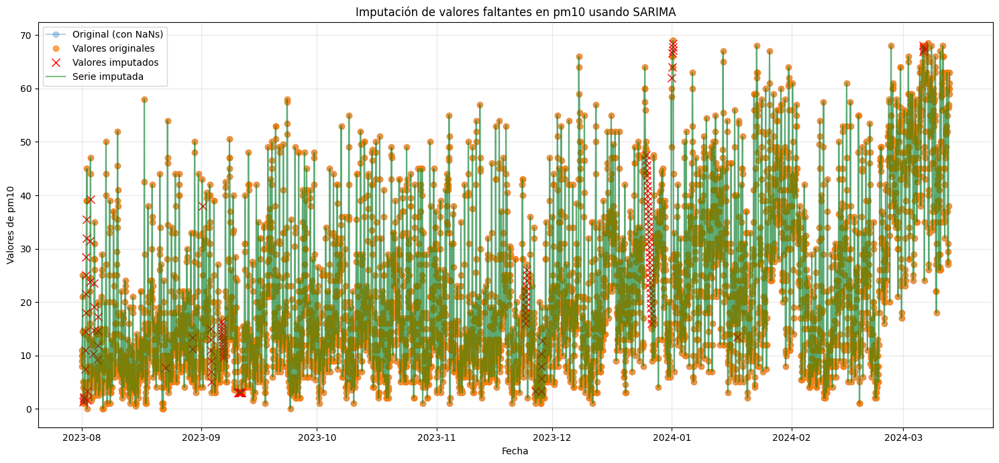

Se encontraron 132 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 21 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 21 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 21 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 21 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 21 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 21 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 21 (1 valores)
Error al imputar valores 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


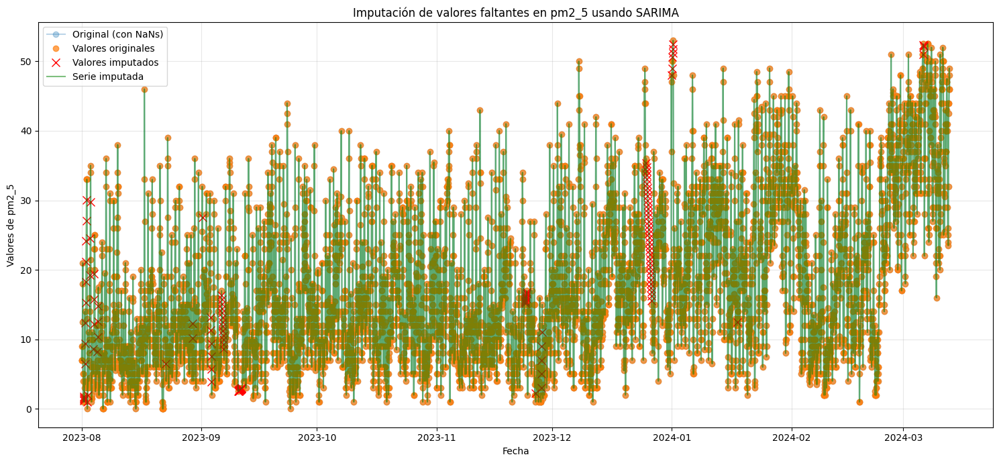

In [ ]:
import warnings

# Ocultar warnings específicos por mensaje o categoría:
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided")
warnings.filterwarnings("ignore", category=FutureWarning)

DF_AQ1_F_I = imputar_valores_sarima(DF_AQ1_FC,columna='pm10',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ1_F_I = imputar_valores_sarima(DF_AQ1_F_I,columna='pm2_5',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ1_F_I = imputar_valores_sarima(DF_AQ1_F_I,columna='pm5',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ1_F_I = imputar_valores_sarima(DF_AQ1_F_I,columna='humidity',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ1_F_I = imputar_valores_sarima(DF_AQ1_F_I,columna='temperature',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ1_F_I = imputar_valores_sarima(DF_AQ1_F_I,columna='co',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)

Se encontraron 136 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 25 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 25 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 25 (1 valores)
Error al imputar valores 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios


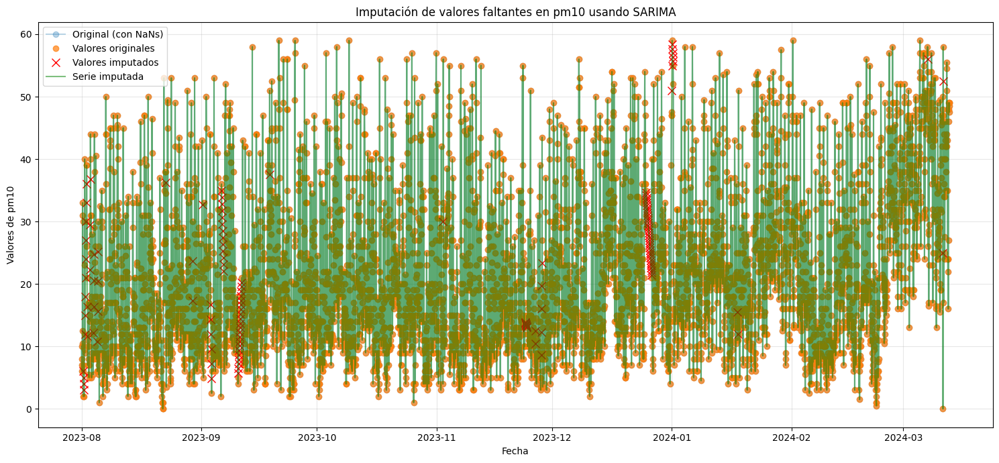

Se encontraron 136 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 25 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 25 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 25 (1 valores)
Error al imputar valores 

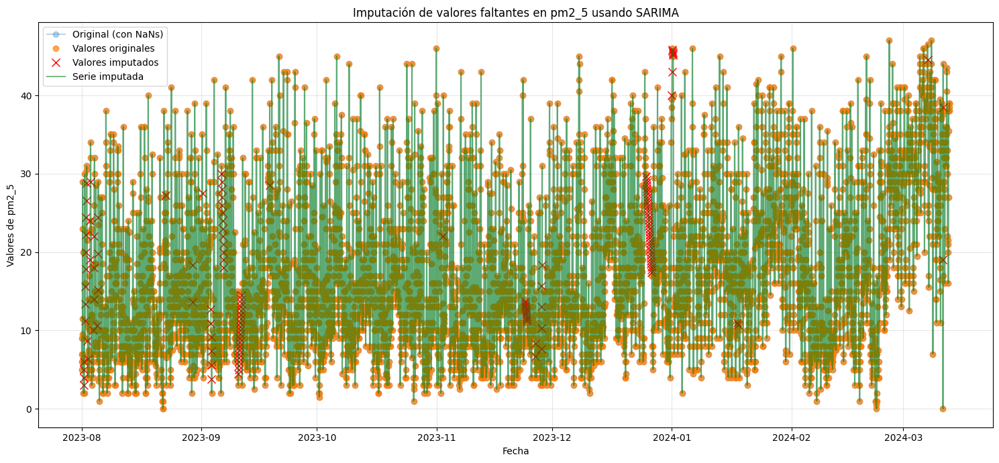

Se encontraron 136 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 25 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 25 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 25 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 8 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 9 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 10 de 25 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 11 de 25 (13 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 12 de 25 (21 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 13 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 14 de 25 (1 valores)
Error 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 21 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 22 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 23 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 24 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 25 de 25 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios


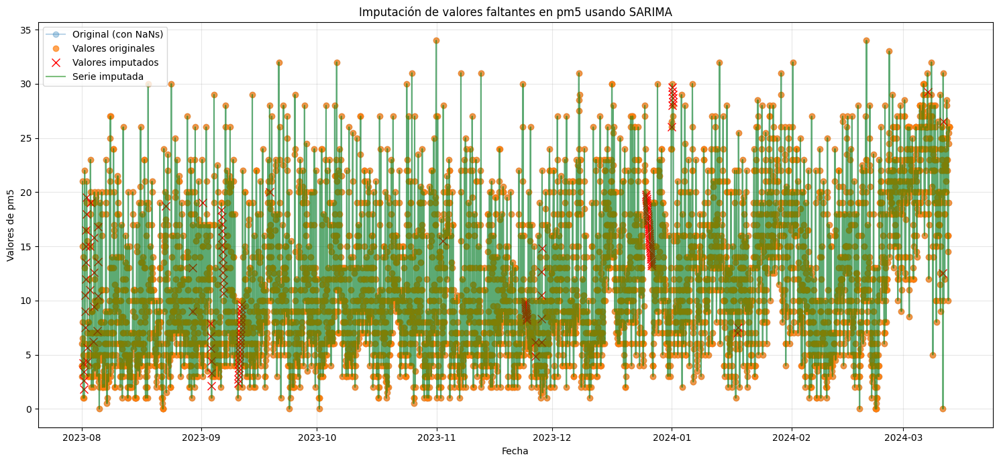

Se encontraron 136 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 25 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 25 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 25 (1 valores)
Error al imputar valores 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 14 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 15 de 25 (11 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 16 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 17 de 25 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 18 de 25 (34 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 19 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 20 de 25 (5 valores)
Erro

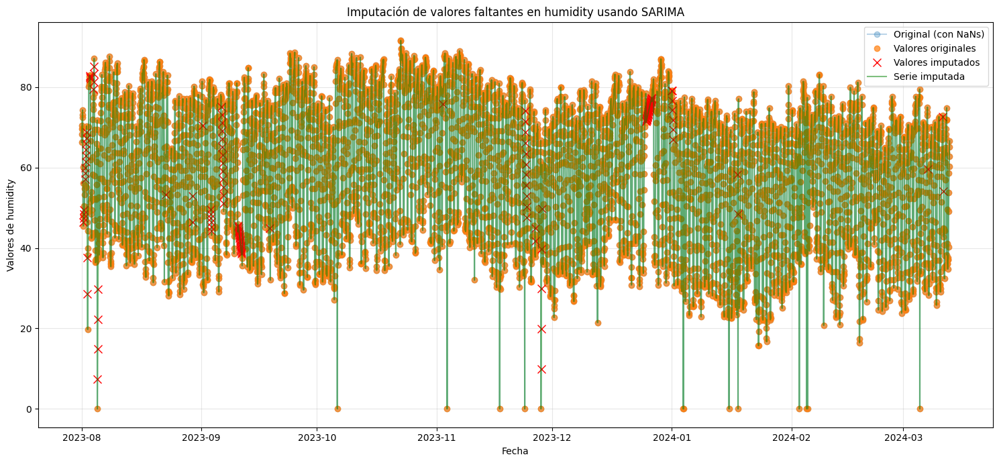

Se encontraron 136 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 25 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 25 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 25 (1 valores)
Error al imputar valores 

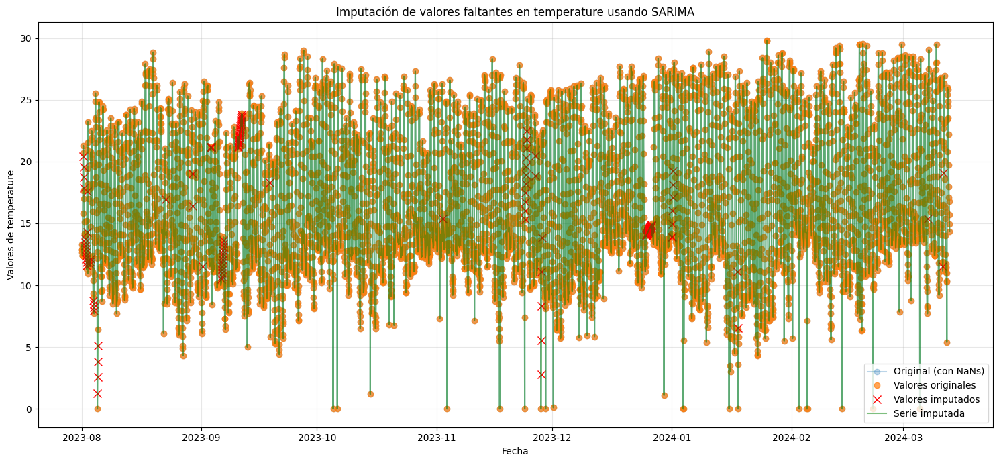

Se encontraron 136 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 25 (9 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 25 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 25 (4 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 25 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 8 de 25 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 9 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 10 de 25 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 11 de 25 (13 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 12 de 25 (21 valores)
Error al

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 25 de 25 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios


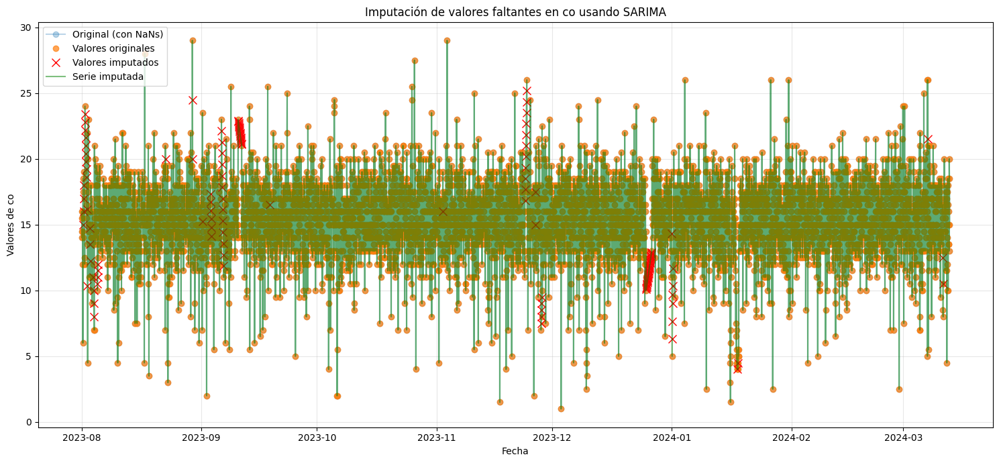

In [46]:
import warnings

# Ocultar warnings específicos por mensaje o categoría:
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided")
warnings.filterwarnings("ignore", category=FutureWarning)

DF_AQ2_F_I = imputar_valores_sarima(DF_AQ2_FC,columna='pm10',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ2_F_I = imputar_valores_sarima(DF_AQ2_F_I,columna='pm2_5',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ2_F_I = imputar_valores_sarima(DF_AQ2_F_I,columna='pm5',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ2_F_I = imputar_valores_sarima(DF_AQ2_F_I,columna='humidity',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ2_F_I = imputar_valores_sarima(DF_AQ2_F_I,columna='temperature',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQ2_F_I = imputar_valores_sarima(DF_AQ2_F_I,columna='co',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)

Se encontraron 831 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 235 (17 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 235 (1 valores)
Error al imputar

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 19 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 20 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 21 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 22 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 23 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 24 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 25 de 235 (9 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 41 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 42 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 43 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 44 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 45 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 46 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 47 de 235 (5 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 115 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 116 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 117 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 118 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 119 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 120 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 121 de 235 (1 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 182 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 183 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 184 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 185 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 186 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 187 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 188 de 235 (2 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 189 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 190 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 191 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 192 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 193 de 235 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 194 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 195 de 235 (7 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 208 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 209 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 210 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 211 de 235 (16 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 212 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 213 de 235 (18 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 214 de 235 (1

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 215 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 216 de 235 (14 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 217 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 218 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 219 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 220 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 221 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 222 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 223 de 235 (1 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 230 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 231 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 232 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 233 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 234 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 235 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios


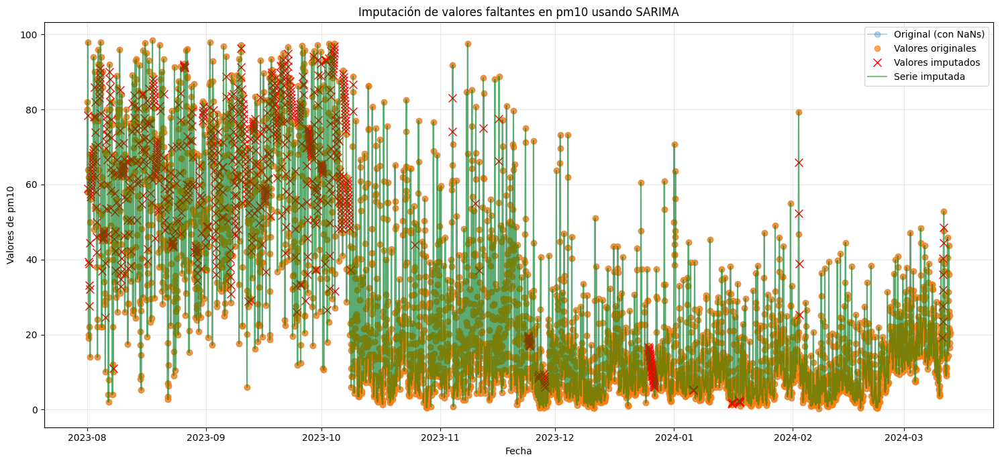

Se encontraron 831 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 235 (17 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 235 (1 valores)
Error al imputar

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 12 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 13 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 14 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 15 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 16 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 17 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 18 de 235 (1 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 92 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 93 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 94 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 95 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 96 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 97 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 98 de 235 (2 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 104 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 105 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 106 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 107 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 108 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 109 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 110 de 235 (3 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 114 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 115 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 116 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 117 de 235 (3 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 118 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 119 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 120 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 121 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 122 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 123 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 124 de 235 (21 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 129 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 130 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 131 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 132 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 133 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 134 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 135 de 235 (2 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 140 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 141 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 142 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 143 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 144 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 145 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 146 de 235 (4 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 169 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 170 de 235 (10 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 171 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 172 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 173 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 174 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 175 de 235 (2 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 185 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 186 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 187 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 188 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 189 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 190 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 191 de 235 (1 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 194 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 195 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 196 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 197 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 198 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 199 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 200 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 201 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 202 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 203 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 204 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 205 de 235 (10 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 206 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 207 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 208 de 235 (3 

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 216 de 235 (14 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 217 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 218 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 219 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 220 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 221 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 222 de 235 (1 

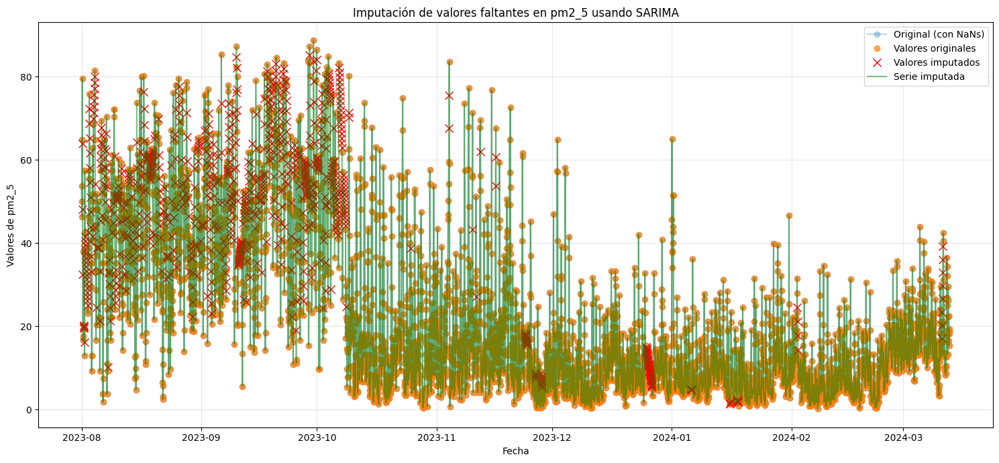

Se encontraron 950 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 208 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 208 (238 valores)
Error al imputar valores intermedios: 0


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 208 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 208 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 208 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 8 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 9 de 208 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 10 de 208 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 11 de 208 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 12 de 208 (1 valores)
Err

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 17 de 208 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 18 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 19 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 20 de 208 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 21 de 208 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 22 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 23 de 208 (2 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 107 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 108 de 208 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 109 de 208 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 110 de 208 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 111 de 208 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 112 de 208 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 113 de 208 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 114 de 208 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 115 de 208 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 116 de 208 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 117 de 208 (1 v

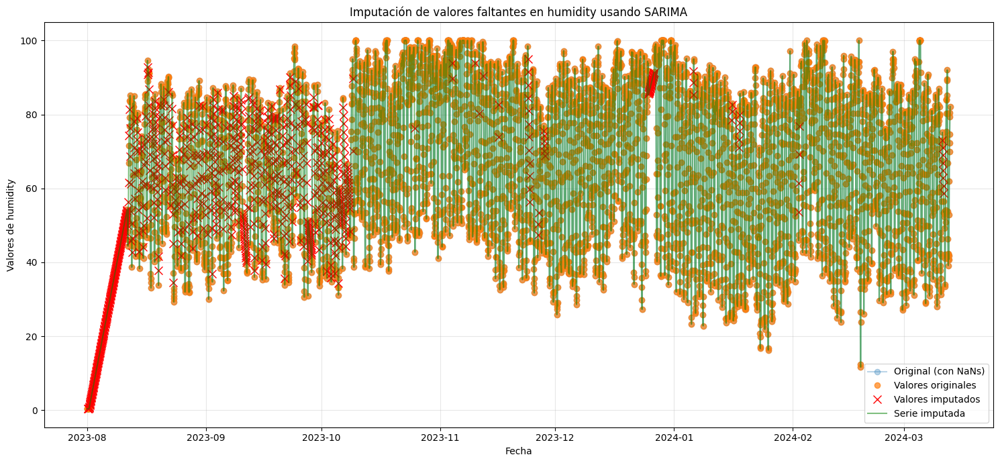

Se encontraron 831 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 235 (17 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 235 (1 valores)
Error al imputar

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 125 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 126 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 127 de 235 (8 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 128 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 129 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 130 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 131 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 132 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 133 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 134 de 235 (1 v

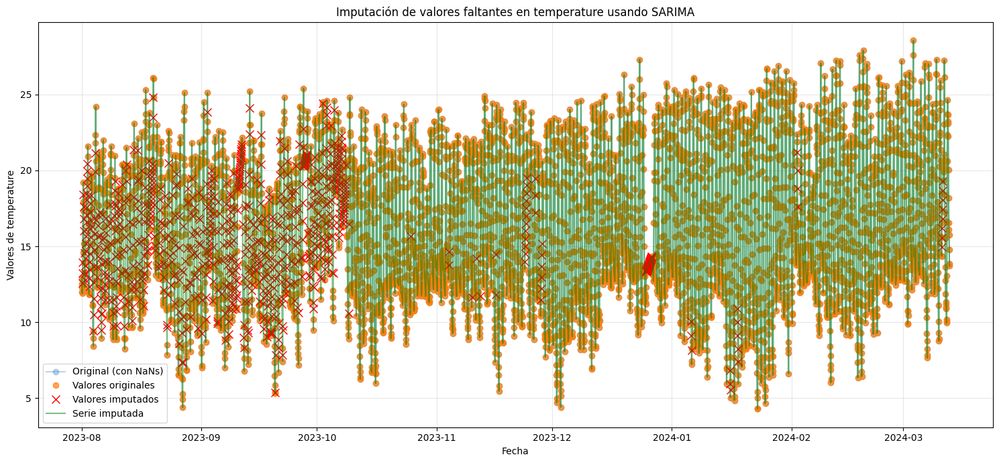

Se encontraron 831 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 235 (17 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 8 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 9 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 10 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 11 de 235 (7 valores)
Err

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 23 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 24 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 25 de 235 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 26 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 27 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 28 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 29 de 235 (1 valores)

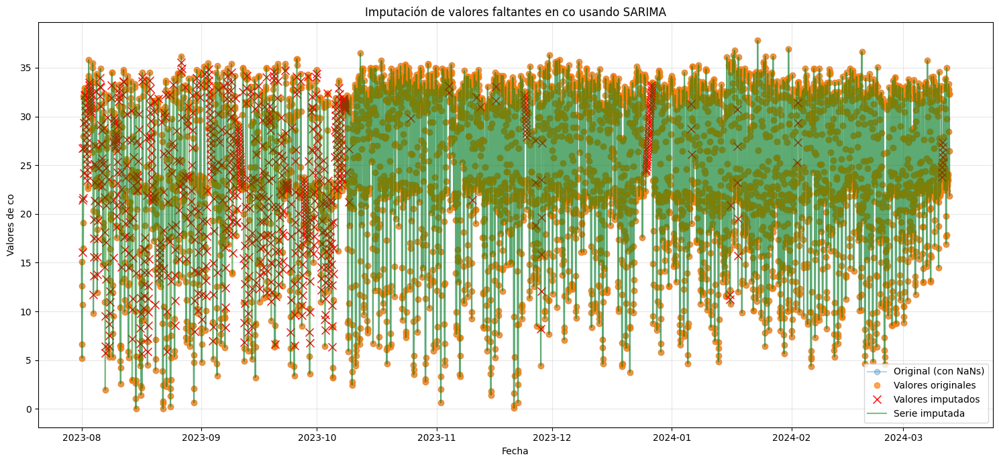

Se encontraron 831 valores faltantes
Usando parámetros SARIMA: (2, 0, 1) x (0, 0, 0, 24)
Imputando secuencia 1 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 2 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 3 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 4 de 235 (17 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 5 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 6 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 7 de 235 (1 valores)
Error al imputar

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 27 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 28 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 29 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 30 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 31 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 32 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 33 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 34 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 35 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 36 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 37 de 235 (4 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 46 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 47 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 48 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 49 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 50 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 51 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 52 de 235 (7 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 70 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 71 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 72 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 73 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 74 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 75 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 76 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 77 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 78 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 79 de 235 (2 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 82 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 83 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 84 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 85 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 86 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 87 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 88 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 89 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 90 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 91 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 92 de 235 (4 valores)

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 152 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 153 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 154 de 235 (6 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 155 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 156 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 157 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 158 de 235 (4 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 188 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 189 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 190 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 191 de 235 (1 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 192 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 193 de 235 (9 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 194 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 195 de 235 (7 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 196 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 197 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 198 de 235 (2 v

/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 223 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 224 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 225 de 235 (2 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 226 de 235 (12 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 227 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 228 de 235 (6 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 229 de 235 (35 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 230 de 235 (3 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 231 de 235 (2 valores)


/home/steven-laptop/Documentos/Estudio/Proyecto QAIR/air_quality/air2/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 232 de 235 (1 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 233 de 235 (5 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 234 de 235 (4 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios
Imputando secuencia 235 de 235 (8 valores)
Error al imputar valores intermedios: 0
Usando interpolación lineal para imputar valores intermedios


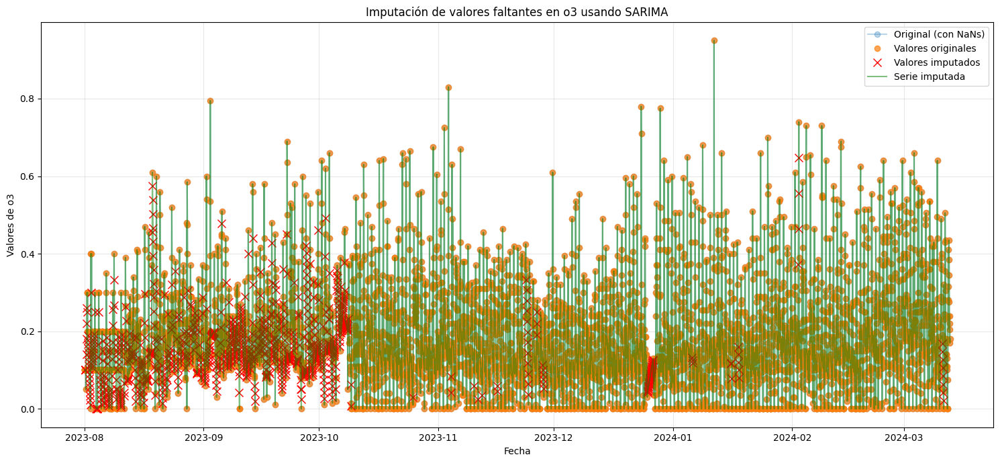

In [47]:
import warnings

# Ocultar warnings específicos por mensaje o categoría:
warnings.filterwarnings("ignore", message="No supported index is available")
warnings.filterwarnings("ignore", message="A date index has been provided")
warnings.filterwarnings("ignore", category=FutureWarning)

DF_AQSEP_F_I = imputar_valores_sarima(DF_AQSEP_FC,columna='pm10',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQSEP_F_I = imputar_valores_sarima(DF_AQSEP_F_I,columna='pm2_5',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQSEP_F_I = imputar_valores_sarima(DF_AQSEP_F_I,columna='humidity',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQSEP_F_I = imputar_valores_sarima(DF_AQSEP_F_I,columna='temperature',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQSEP_F_I = imputar_valores_sarima(DF_AQSEP_F_I,columna='co',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)
DF_AQSEP_F_I = imputar_valores_sarima(DF_AQSEP_F_I,columna='o3',order=(2, 0, 1),seasonal_order=(0, 0, 0, 24),plot=True)

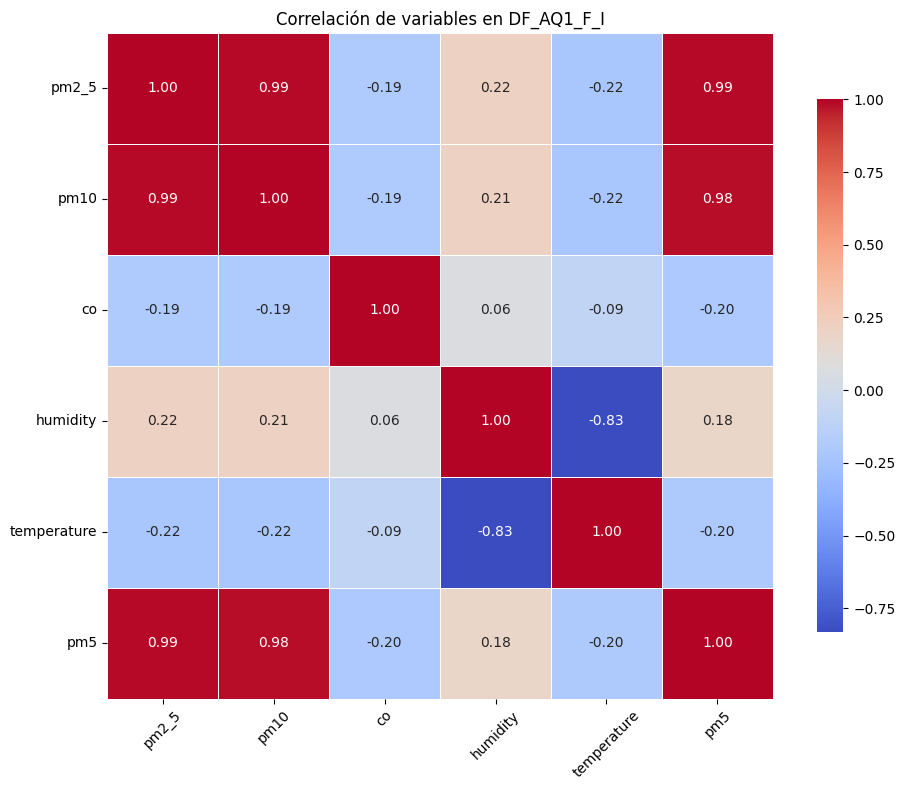

In [48]:
plot_correlation_map(DF_AQ1_F_I, title="Correlación de variables en DF_AQ1_F_I")

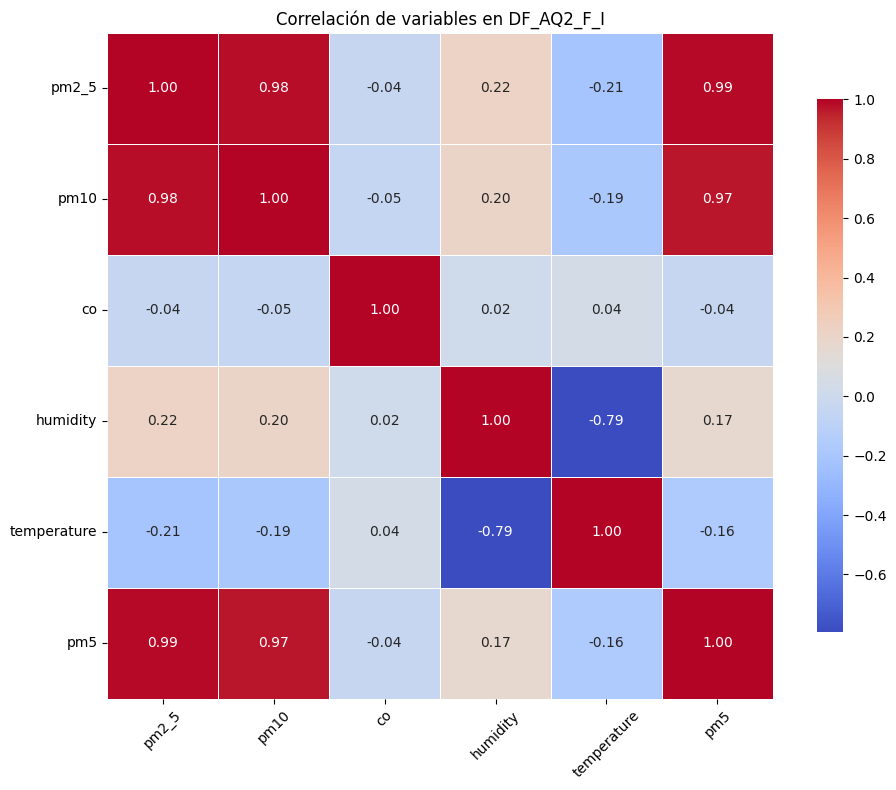

In [49]:
plot_correlation_map(DF_AQ2_F_I, title="Correlación de variables en DF_AQ2_F_I")

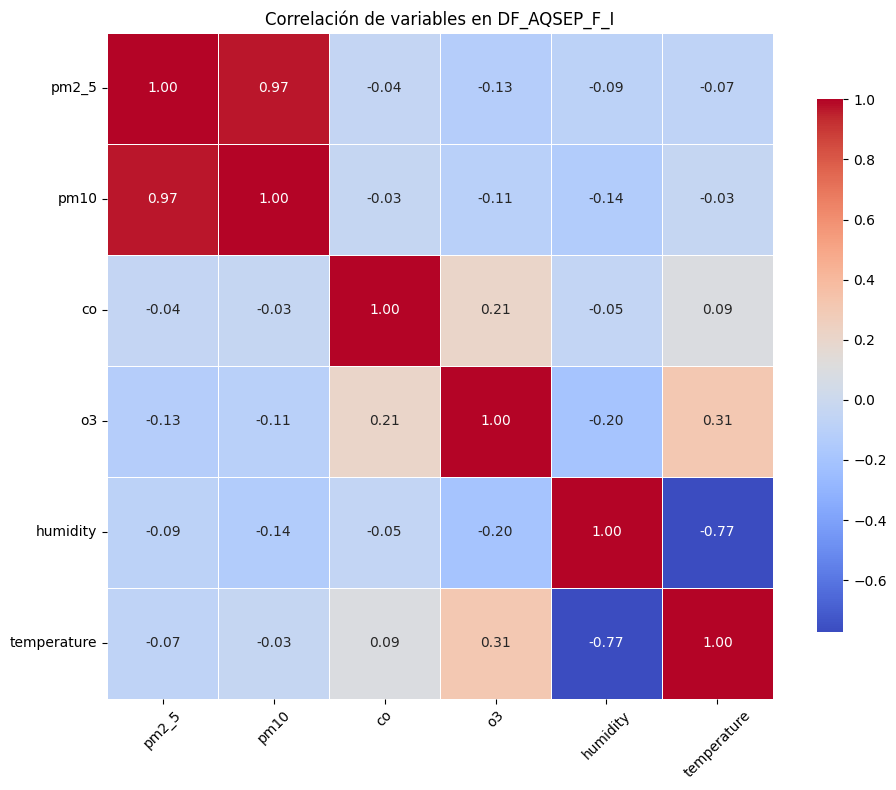

In [50]:
plot_correlation_map(DF_AQSEP_F_I, title="Correlación de variables en DF_AQSEP_F_I")

In [53]:
def create_and_insert_resampled_tables(dataframes_dict):
    """
    Crea tablas en la base de datos si no existen y luego inserta los datos resampleados.

    Parámetros:
        dataframes_dict (dict): Diccionario con clave como nombre de la tabla y valor el DataFrame

    Retorna:
        None
    """
    if engine is None:
        raise Exception("⚠️ Debes ejecutar primero `connect_to_db()` para establecer la conexión.")

    inspector = inspect(engine)

    for table_name, df in dataframes_dict.items():
        try:
            # Verificar si la tabla ya existe
            if table_name in inspector.get_table_names():
                print(f"ℹ️ La tabla '{table_name}' ya existe. No se creó ni sobrescribió.")
            else:
                # Crear tabla e insertar datos
                df.to_sql(name=table_name, con=engine, if_exists='fail', index=True)
                print(f"✅ Tabla '{table_name}' creada y datos insertados ({len(df)} registros).")
        except Exception as e:
            print(f"❌ Error en la tabla '{table_name}': {e}")


In [54]:
resampled_dfs = {
    "DF_AQ2_IMPUTED": DF_AQ2_F_I,
    "DF_AQ1_IMPUTED": DF_AQ1_F_I,
    "DF_AQSEP_IMPUTED": DF_AQSEP_F_I
}

create_and_insert_resampled_tables(resampled_dfs)


✅ Tabla 'DF_AQ2_IMPUTED' creada y datos insertados (5401 registros).
✅ Tabla 'DF_AQ1_IMPUTED' creada y datos insertados (5401 registros).
✅ Tabla 'DF_AQSEP_IMPUTED' creada y datos insertados (5401 registros).
